# Проект "Исследование рынка общественного питания в Москве"

### Описание проекта
Фонд «Shut Up and Take My Money» планирует открыть бизнес в области общественнного питания, однако пока инвесторы не имееют точного представления, каким образом оформить планируемое дело. Для уточнения перспектив будущего бизнеса необходимо выяснить основные особенности рынка общественного питания Москвы, в особенности относительно расположения первых точек.

### Цели и задачи проекта
Целью проекта выступает выявление наиболее переспективных мест в Москве для открытия нового бизнеса в сфере общественного питания.  
Для достижения цели проекта потребуется решить следующие задачи:  
- произвести загрузку и предобарботку необходимых данных для проекта,
- произвести анализ данных,
- предложить валидные детали будущего бизнеса,
- подготовить презентацию.

### Описание данных
Для проекта доступен датасет `moscow_places.csv`, содержащий общую информацию о заведениях общественного питания Москвы за лето 2022 года на основе данных сервисов Яндекса (Карты и Бизнес). Датасет включает следующую информацию:  
- `name` — название заведения,
- `address` — адрес заведения,
- `category` — тип завдения,
- `hours`— рабочие часы заведения,
- `lat` — широта географического расположения завдения,
- `lng` — долгота географического расположения завдения,
- `rating` — рейтинг заведения по 5-балльной шкале,
- `price` — категория цен в заведении,
- `avg_bill` — средний чек в заведении за типовой заказ,
- `middle_avg_bill` — оценка среднего чека,
- `middle_coffee_cup` — оценка среднего чека за чашку капучино,
- `chain` — метка сетевого бизнеса,
- `district` — административный район, в котором расположено заведение,
- `seats` — количество посадочных мест.

------------------------------------------

## Загрузка и общий обзор данных
На данном этапе мы загружаем датасет `moscow_places.csv` и проверяем его на соответсвие описнаию, а также удостоверяемся в его готовности к исследовательскому анализу. В случае выявленяи проблем мы скорректируем данные на этапе предобработки.  
Начнем с загрузки необходимых библиотек, а затем преобразуем датасет в рабочий датафрейм.

In [1]:
# загрузим необходимые для дальнейшей работы библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
import json
import re

In [2]:
# обновляем plotly до версии 5.5.0 для использования параметра "text_auto"
#!pip install plotly==5.5.0

In [3]:
# загрузим датасет в рабочий датафрейм "data"
data = pd.read_csv('https://drive.google.com/uc?id=1jaeEVCkF5Zcrrt5omh6-qn18SGFIIdlw')

In [4]:
# ознакомимся с полученным датафреймом
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Как мы видим, датафрейм соотвествует описанию. Уже на первых записях мы видим, что далеко не все данные представлены в полном виде для каждого заведения, что потребует отдельного внимания на этапе предобработки.  
Посмотрим, какова структура датафрейма.

In [5]:
# выведем общую информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Из 14 полей 6 имеют пропуски, а по типам представленных данных мы можем утверждать, что данные представлены в соответствующих их природе виде. Однако поля `seats`, `middle_avg_bill` и `middle_coffee_cup` представлены в виде непрерывной величины, хотя для них мы ожидаем дискретный характер.  
Посмотрим, сколько представлено заведений и категорий.

In [6]:
# выведем количество уникальных наименований и количество категорий
print(f'Всего уникальных заведений в датасете: {data["name"].unique().size}')
print(f'Всего категорий заведений: {data["category"].unique().size}')
# выведем категории
f'Категории: {data["category"].unique()}'

Всего уникальных заведений в датасете: 5614
Всего категорий заведений: 8


"Категории: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'\n 'булочная' 'столовая']"

Уникальных заведений 5614, а категорий всего 8. Помимо интересующих нас кофеен, в датасете представлены и кафе, пиццерии, рестораны и другие заведения общественного питания.

### Промежуточный вывод
Представленный датасет имеет 14 столбцов, каждый из которых описывает отдельное заведение общественного питания. Всего в датасете 8406 записей, которые описывают 5614 уникальных заведений в 8 категориях (от кофейни до ресторана).  
- Столбцы `name`, `category`, `address` и `district` представлены строковыми значениями, описывающими название, категорию, адрес и район заведения, (предварительно) без пропусков.  
- Столбцы `hours`, `price` и `avg_bill` описывают в виде строки часы работы, категорию цен и средений чек, однако в них явно присутствуют пропуски.  
- Столбцы `middle_avg_bill`, `middle_coffee_cup` и `seats` представляют среднее значение счета, среднюю стоимость кофе и количество мест в виде непрерывных переменных, хотя подразумеваются дискретный характер, а также изобилуют пропусками.  
- Столбцы `lat`, `lng` и `rating` отражают широту, долготу и рейтинг заведения соответственно в виде чисел с плавающей точкой без явных пропусков.  
- И отдельно стоит отметить атрибут `chain`, отражающий сетевой характер заведения в формате `int` (1 - `True`, 0 - `False`).

На следующем этапе мы предобработаем имеющиеся данные и скорректируем как выявленные, так и пока скрытые изъяны для последовательного анализа рынка общественного питания в Москве.

## Предобработка данных
Ранее мы выяснили, что данные далеки от образцовой целостности, изобилуя пропусками, а типы столбцов не всегда соответствуют подразумеваемым. Обобщим наши знания о пропусках и предусмотрим потенциальные проблемы при дальнейшем анализе. 

Для начала проверим, есть ли дубликаты. Заведения могут иметь одно название, если они относятся к сети, но вряд ли заведения сети располгаеются по одному адресу, поэтому дубликаты будем проверять по совпадению названия и адреса. Проверим это.

In [7]:
# проверим, сколько дубликатов заведений представлено в данных
data.duplicated(subset=['name', 'address']).sum()

0

Дубликатов не обнаружено. Теперь посмотрим на столбцы с пропусками и сформируем стратегию работы с ними.

In [8]:
# оценим целостность данных
for col in data.columns:
    # найдем процент пропусков от общего числа значений
    percentage = data[col].isna().sum() / data[col].size
    # выведем только столбцы с пропусками
    if percentage > 0:
        print(f'Столбец \"{col}\" недостаточен на {percentage:.2%}')

Столбец "hours" недостаточен на 6.38%
Столбец "price" недостаточен на 60.56%
Столбец "avg_bill" недостаточен на 54.60%
Столбец "middle_avg_bill" недостаточен на 62.54%
Столбец "middle_coffee_cup" недостаточен на 93.64%
Столбец "seats" недостаточен на 42.96%


Как мы видим, из 14 столбцов 6 имеют пропуски, причем у 4 из них процент превышает 50%, что крайне много. Поскольку некоторые столбцы будут важны для анализа, рассмотрим каждый столбец по отдельности.  
Мы уже знаем, что столбцы `hours`, `price`, `avg_bill` содержат строки с режимом работы, категорией цен и средним чеком. Здесь мы заполним пропуски строкой `unknown`.  
Столбцы `seats`, `middle_avg_bill` и `middle_coffee_cup`, отображающию количество мест и среднюю стоимость продукта, заполним отрицательным значением `-1`, т.к. нулевые значения уже присутствуют, а пропуски могут быть как предполагаемым нулевым или незаполненным значением в сервисе.  
Заполним пропуски.

In [9]:
# заполним пропуски в столбцах "hours", "price" и "avg_bill"
data[['hours', 'price', 'avg_bill']] = data[['hours', 'price', 'avg_bill']].fillna('unknown')

# заполним пропуски в столбце "seats", "middle_avg_bill" и "middle_coffee_cup"
data[['seats', 'middle_avg_bill', 'middle_coffee_cup']] = data[['seats', 'middle_avg_bill', 'middle_coffee_cup']].fillna(-1)  

# проверим результат
data.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

Теперь, когда мы избавились от пропусков, приведем типы данных к предполагаемым у столбцов `seats`, `middle_avg_bill` и `middle_coffee_cup`.

In [10]:
# приведем типы данных столбцов к типу "int"
columns_to_change = ['seats', 'middle_avg_bill', 'middle_coffee_cup']
for col in columns_to_change:
    data[col] = pd.to_numeric(
        arg = data[col],
        downcast = 'integer'
    )
# проверим результат
data[['seats', 'middle_avg_bill', 'middle_coffee_cup']].dtypes

seats                int16
middle_avg_bill      int32
middle_coffee_cup    int16
dtype: object

Помимо приведения типов и устранения пропусков, также потребуется обогатить данные дополнительными столбцами: `street` и `24/7`, представлющими данные об улице заведения и круглосуточном режиме работы.

In [11]:
# создадим столбец "street" со значением улицы из столбца "address"
#data['street'] = data['address'].apply(lambda x: x.split(',')[1]) # было
data['street'] = data['address'].apply(lambda x: re.split(r', ', x)[1]) # исправленный вариант с regex

# проверим результат
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,-1,-1,0,-1,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,-1,0,4,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,-1,0,45,Клязьминская улица


In [12]:
# создадим столбец "24/7" с булевым значением круглосуточной работы
data['24/7'] = data['hours'].apply(lambda x: x == 'ежедневно, круглосуточно')
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,-1,-1,0,-1,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,-1,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,-1,0,45,Клязьминская улица,False


In [13]:
# переименуем название категории "бар,паб" в "бар/паб"
data['category'] = data['category'].replace({'бар,паб': 'бар/паб'})

Теперь, когда данные не только предобработаны, но и обогащены, можно приступать к анализу рынка заведений общественного питания Москвы.

### Промежуточный вывод
По результатам предобработки данных мы получили готовый датафрейм для исследования заведений общественного питания в Москве. Для этого мы сделали следующие шаги:  
- мы избавились от пропусков, заменив их формальными значениями в соответствии с предполагаемым типом столбца (`unknown` для строк и `-1` для скалярных величин),
- произвели проверку данных на дубликаты по совпадению "название"-"расположение" и получили отрицательный результат,
- преобразовали типы некоторых столбцов в изначально предполагаемые (`float` в `int`),
- обогатили данные двумя столбцами: `street` с названием улицы и `24/7` с булевым значение круглосуточной работы заведения.

## Исследование ранка общественного питания Москвы
На данном этапе мы проанализируем располгаемые данные для получения наиболее полного представления о том, каким образом устроен рынок общественного питания Москвы, чтобы впоследствии выявить основу для потенциально успешной стратегии выхода на рынок.  
Начнем с категорий заведений, а именно: какие категории завдений общественного питания наиболее распространены, а какие представлены слабо. Для ответа на вопрос построим сводную таблицу, а уже по ней построим визуализацию.

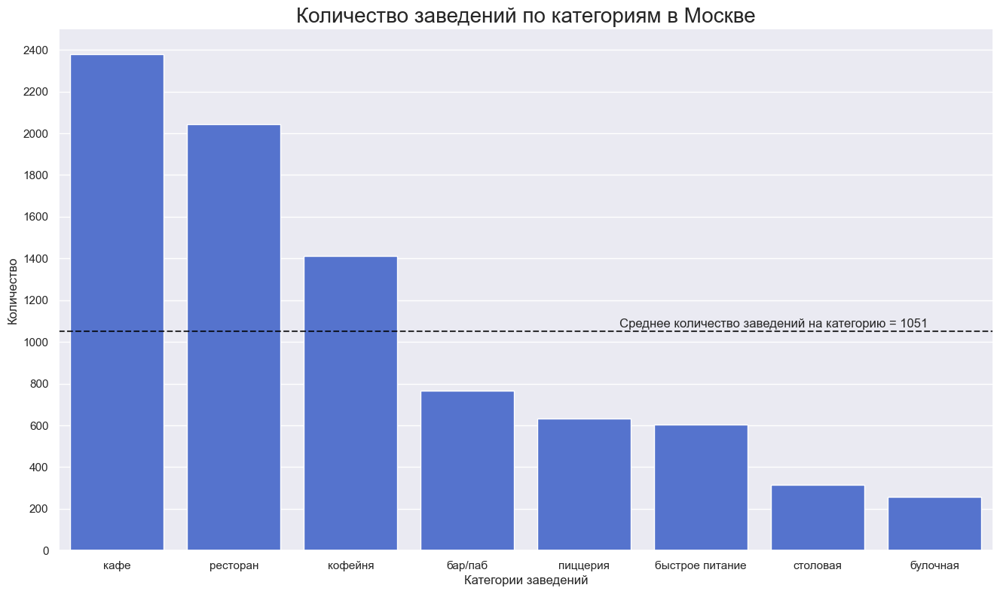

In [14]:
# построим сводную таблицу по количеству заведений каждого типа
kinds_of_cafes = data.pivot_table(
    index = 'category',
    values = 'name',
    aggfunc = 'count'
).sort_values(by='name', ascending=False) # дополнительно отсортируем полученные значения

# установим тему и палитру для графиков
sns.set_theme(rc={'figure.figsize':(16,9)})
sns.set_palette('colorblind')

# построим столбчатую диаграмму и созраним ее в переменной "ax"
ax = sns.barplot(
    data = kinds_of_cafes,
    x = kinds_of_cafes.index,
    y = 'name',
    color = 'royalblue'
)

# дополним полученную диаграмму подписями и названием
ax.set(
    xlabel='Категории заведений', 
    ylabel='Количество'
)

# добавим линию среднего числа заведений на категорию для контекста оценки
plt.axhline(
    y = kinds_of_cafes['name'].mean(),
    linestyle = '--',
    color = (0, 0, 0, 0.8)
)

# подпишем линию
plt.annotate(
    text = f'Среднее количество заведений на категорию = {kinds_of_cafes["name"].mean():.0f}',
    xy = (4.3, 1070)
)

# отобразим границы по оси ординат с минимального до максимального значения
plt.ylim(0, 2501)
plt.yticks(np.arange(0, 2500, 200))

# добавим название
plt.title('Количество заведений по категориям в Москве', {'fontsize': 20})

plt.show()

Уникальных значений достаточно много (1308), что не позволяет хоть как-то сгруппировать заведения или восполнить предполагаемые значения. Однако есть смысл проверить пропуски по сетевому характеру заведений, т.к. известно, что сети часто имеют единую бизнес-модель, а следовательно и единый режим работы. Проверим, даст ли такое предположение нам возможность восполнить пропуски.

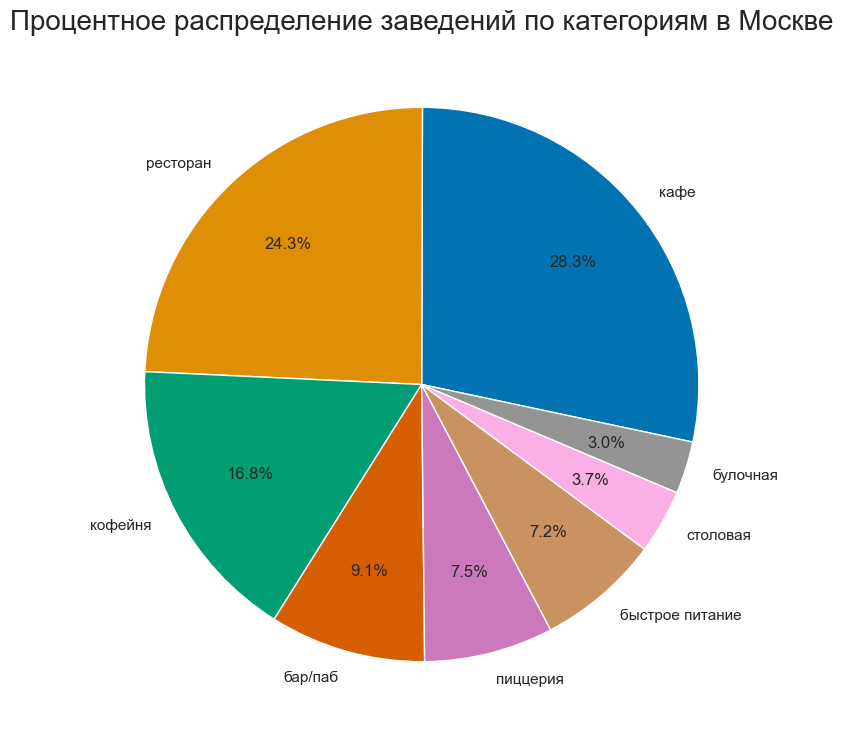

In [15]:
# дополним столбчатую диаграмму круговой
plt.pie(
    kinds_of_cafes['name'],
    labels = kinds_of_cafes.index,
    autopct = '%.1f%%',
    pctdistance = 0.7,
    startangle = -12
)
# добавим название
plt.title('Процентное распределение заведений по категориям в Москве', {'fontsize': 20})

plt.show()

Как мы видим, около 70% заведений принадлежат одной из трех категорий: ресторан, кафе, кофейня. Оставшиеся 30% представлены менее распространенными категориями: бар/паб, пиццерия, быстрое питание, столовая и булочная. Немногим больше четверти от всех заведений принадлежит категория "кафе" - около 2 375 заведений. Данная категория самая распространенная, но и самая размытая по ключевым характеристикам. Сопоставимый уровень демонстрируют рестораны: около 2050 заведений или 24% от всего числа. И замыкает тройку категорий-лидеров кофейня - около 17% или 1400 заведений. Остальные категории представлены намного меньше (ниже среднего числа на категорию), поэтому их распространение можно классифицировать как низкое как в относительных, так и в абсолютных значениях.  
Почему так распределены значения? Возможно, влияет количество посадочных мест, а возможно известность сети или другой фактор. Выясним, каким образом распределяются значения относительно дополнительных характеристик. Для начала сфокусируемся на количестве посадочных мест. Для этого возьмем отфильтрованный датасет без пропусков.

In [16]:
# отфильтруем данные для визуализации актуальных записей
data_per_seats = data[data['seats']>=0][['name', 'category', 'seats']]

# создадим ящики с усами для каждой переменной
# создадим список с категориями заведений
categs = data_per_seats['category'].unique()

# создадим словарь с одноименными списку ключами и предустановленными цветами в качестве значений
colour_dict = {'ресторан': 'navy', 'кафе': 'saddlebrown', 'пиццерия': 'crimson', 'бар/паб': 'darkcyan',
               'быстрое питание': 'darkslategrey', 'булочная': 'darkred', 'столовая': 'forestgreen', 'кофейня': 'black'}
# создадим общую фигуру и на ней циклом нанесем ящики с усами
fig = go.Figure()
for categ in categs:
    fig.add_trace(go.Box(
        x = data_per_seats['category'][data_per_seats['category'] == categ],
        y = data_per_seats['seats'][data_per_seats['category'] == categ],
        boxpoints = 'all', # добавляем jitter для отображения всех значений
        name = categ,
        fillcolor = 'ivory',
        marker_color = colour_dict[categ]
    )
                 ).update_layout(
        autosize = False,
        width = 1000,
        height = 800,
        xaxis_title = 'Категория заведения', 
        yaxis_title = 'Количество мест',
        title = 'Распределение количества мест на категорию заведений'
    )
fig.update_layout(title_x=0.5)

fig.show()

Мы наблюдаем широкий разброс значений количества мест относительно каждой категории: размах каждой категории составляет от 0 до 1100 мест, что, конечно же, не демонстрирует типичные значения. Сфокусируемся на межквартильном размахе ящиков. Как мы можем наблюдать, медианное значение количества посадочных мест в заведениях общественного питания Москвы составляет 70 мест. Более того, все категории равномерно распределены вокруг медианного значения: медианы каждой категории попадает в промежуток 60-80 мест. Важно учесть и размах категорий. Такие заведения, как ресторан, бар/паб, быстрое питание и кофейня имеют более широкий размах усов (0-300), пока у прочих категорий он уже - 0-250. Можно предположить, что заведения с широким размахом усов более разнообразны по целевой аудитории, кофе и среденему чеку (+ более дорогая аренда), пока прочие более дешевые и типовые по характеристикам. Но в любом случае главное:  
- медиана = 70 мест,
- размах категории = [30;120] - [50-150],
- разах усов ресторанов, баров, быстрого питания и кофеен = [0;300]
- разах усов кафе, пиццерий, булочных и столовых = [0;250].  

Однако важно еще учитывать и сетевой характер. Посмотрим, как влияет сетевой статус на заведения.

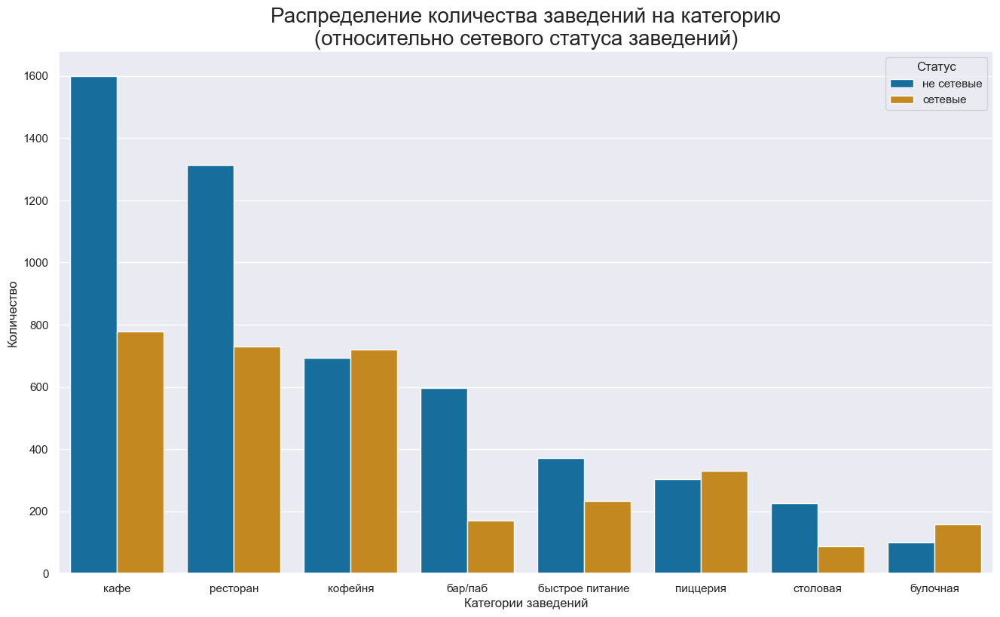

In [17]:
# отфильтруем и подготовим данные для визуализации актуальных записей
chain_data = data.groupby(['category', 'chain'])['name'].agg(
    'count'
).reset_index(
    drop=False
).sort_values(
    by='name', 
    ascending=False
).replace({0: 'не сетевые', 1: 'сетевые'})

# визуализируем количество заведений разных категорий в разврезе сетевого статуса
ax = sns.barplot(
    data = chain_data,
    x = 'category',
    y = 'name',
    hue = 'chain'
)
plt.xlabel('Категории заведений')
plt.ylabel('Количество')
plt.title('Распределение количества заведений на категорию\n(относительно сетевого статуса заведений)', {'fontsize': 20})
plt.legend(title='Статус')
plt.show()

Несетевые заведения явно преобладают над сетевым количественно, однако это так не совсеми категориями: кофейни, пиццерии и булочные чаще носят сетевой статус, нежели остальные. В этом плане несетевой характер преимущественно получают кафе, рестораны, бары, заведения быстрого питания и столовые. Во многом преобладание сетевой формы бизнеса у кофеен, пиццерий и булочных связано с более простой формой бизнеса: отсутсвие расширенного меню (например, ЕГАИС), предсказуемая доходность (франшиза) и меньшая затратность по аренде. Особенно в этом плане выделяется кофейня, т.к. требуется минимальное помещение для баристы, посадочные места необязательны (принцип "coffee to go"), а франшиза усиливает спрос и узнаваемость.

Дополним наши наблюдения лидерами рынка. Построим лидерборд из 15 крупнейших (самых распростарненных) игроков на рынке общественного питания.

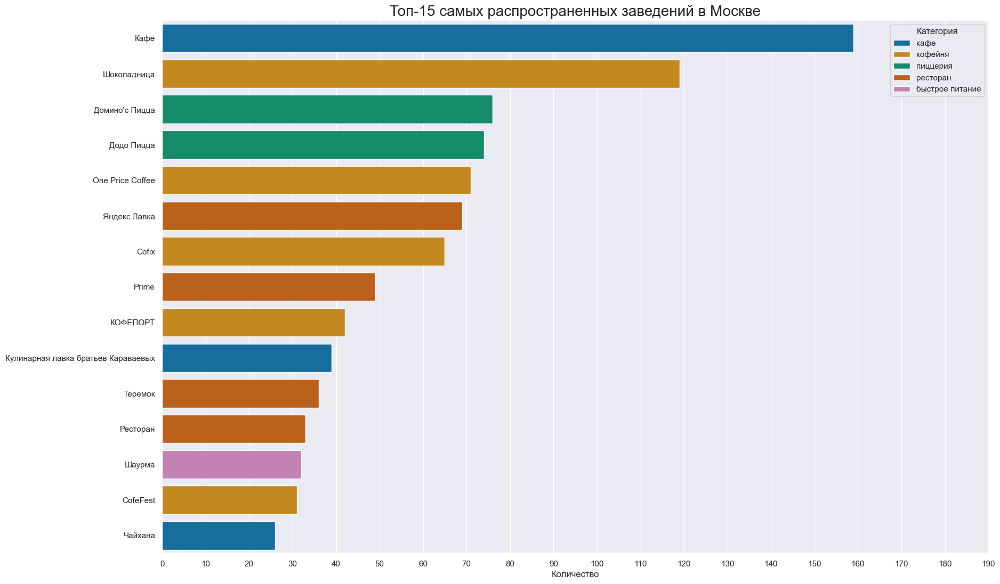

In [18]:
# найдем топ-15 заведений по численности точек и визуализируем их
top_places = data[['name', 'address', 'category']].groupby(['name', 'category'])['address'].agg('count').sort_values(
    ascending=False
).reset_index().iloc[:15]

# визуализируем топ в виде списка с горизонтальной столбчатой диаграммой
plt.figure(figsize=(20, 13))
sns.barplot(data = top_places, x='address', y='name', hue='category', dodge=False)
plt.xlabel('Количество')
plt.ylabel('', rotation=90)
plt.title('Топ-15 самых распространенных заведений в Москве', {'fontsize': 20})
plt.xticks(np.arange(0, 191, step=10))
plt.legend(title='Категория')

plt.show()

Как мы видим, лидером стали заведения "кафе", которые скорее являются отдельными заведениями с непритязательным названием, чем организованной сетью. То же справделиво и для "Ресторана", поэтому их мы учитывать в топе не будем. Действительным лидером с сильным отрывом выступает "Шоколадница" с показателем распространенности свыше 110 точек. Далее следуют пиццерии "Домино`с Пицца" и "Додо Пицца" на уровне свыше 70 точек. На том же уровне выступает и сеть кофеен "One Price Coffee". В целом, мы можем с уверенностью утверждать, что наиболее популярные заведения - именно сетевые, а нибольшую популярность получили кофейни, пиццерии и рестораны.

Сфокусируемся на расположении заведений, т.к. аренда, проходимость, престиж района и др. вляют на бизнес-модель. Посмотрим для начала сколько заведений суммарно располагается в каждом административном округе (АО).

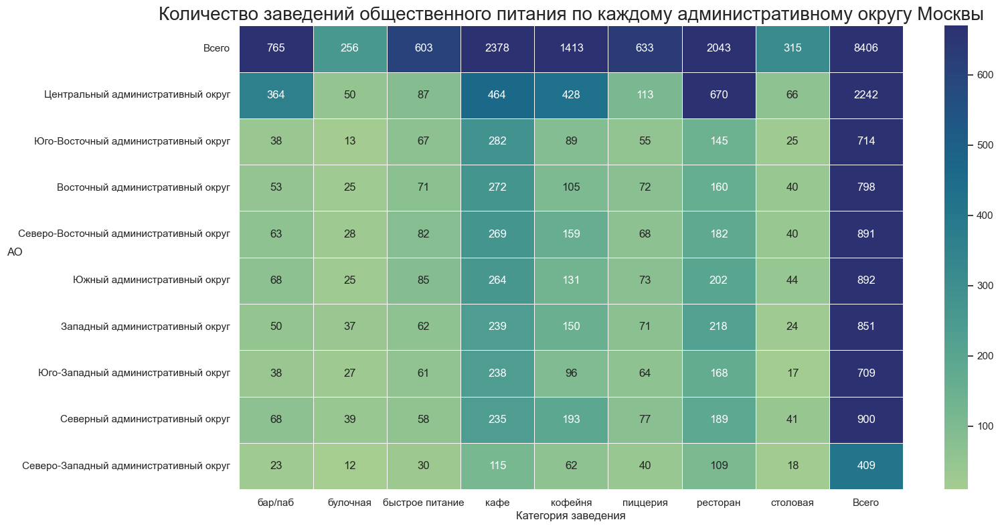

In [19]:
# подготовим данные в виде сводной таблицы
district_data = data.pivot_table(
    index = 'district',
    columns = 'category',
    values = 'name',
    aggfunc = 'count',
    margins = True,
    margins_name = 'Всего'
).sort_values(
    by = 'кафе', 
    ascending = False
)

# создадим тепловую карту
sns.heatmap(
    district_data, 
    vmin = 10,
    vmax = 670, # устанавливаем максимальное значение градиента на максимуме отдельных значений, чтобы общая сумма не меняла градиент
    annot = True, 
    fmt = '.0f', 
    cmap = 'crest', 
    linewidth = .5
)
plt.xlabel('Категория заведения')
plt.ylabel('АО', rotation=0)
plt.title('Количество заведений общественного питания по каждому административному округу Москвы', {'fontsize': 20})
plt.show()

# создадим тепловую карту
#fig = px.imshow(
#    district_data, 
#    text_auto = True,  # работает только с plotly 5.5.0, поэтому: pip install plotly==5.5.0
#    title = 'Количество заведений общественного питания по каждому административному округу Москвы',
#    aspect = 'auto',
#    color_continuous_scale = 'tempo',
#    range_color = [10, 670]
#).update_layout(
#    autosize = False,
#    width = 1000,
#    height = 800,
#    xaxis_title = 'Категория заведения', 
#    yaxis_title = 'АО',
#    title_x = 0.5
#)
#fig.show()

Как мы можем наблюдать, в среднем у большинства АО Москвы количество заведений общественного питания около 800 за исключением Центрального АО с 2242 заведения и Северо-Западного АО, где, наоборот заведений меньше большинства - 409. В целом, мы можем утверждать, что наиболее распространенные категории заведений - кафе, рестораны и кофейни. Эти категории всегда занимают большую долю ото всех заведений вне зависимости от АО. И наоборот, булочные и столовые представлены крайне слабо, едва набирая половину от абсолютных значений прочих категорий заведений. В разрезе АО очевидно лидерство Центрального АО: все категории представлены здесь выше прочих АО. Выше среднего показатели у Северного, Северо-Западного и Западного АО.  
Дополним положение рейтингом.  

In [20]:
# создадим скрипичные диаграммы, чтобы выявить распределение рейтинга заведений Москвы
fig = go.Figure()
for categ in categs: # список инициализировали в ячейке выше с аналогичной диаграммой ящика с усами
    fig.add_trace(go.Violin(x = data['category'][data['category'] == categ],
                            y = data['rating'][data['category'] == categ],
                            name = categ,
                            box_visible = True,
                            meanline_visible = True,
                            line_color = colour_dict[categ], # словарь инициализировали в ячейке выше с аналогичной диаграммой
                            fillcolor = 'ivory'
                           )
                 ).update_layout(
        autosize = False,
        width = 1000,
        height = 800,
        xaxis_title = 'Категория заведения', 
        yaxis_title = 'Рейтинг',
        title = 'Распределение рейтинга по категориям заведений Москвы'
    )
fig.update_layout(title_x=0.5)
fig.show()

Показатели рейтинга распределены вокруг значения 4.2. У многих категорий рейтинг достигает макисмального (5) за исключением баров/пабов и кафе. Более высокие рейтинги в общей массе на фоне прочих получают пабы/бары, хотя и нет заведения с максимальной оценкой. Критически низкими рейтингами (<2) изобилуют кафе, рестораны и заведения быстрого питания.  
Посмотрим, как рейтинг распределен по АО Москвы.

Загрузим geojson-файл и сохраним в переменной `state_geo`.

In [21]:
# читаем файл и сохраняем в переменной
with open(r"C:/Users/USER155/Desktop/admin_level_geomap.geojson") as f:
    state_geo = json.load(f)

In [22]:
# создаем датафрейм со средними показателями рейтинга для каждого АО
data_rating = data.groupby('district')['rating'].agg('mean').reset_index()

# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаем датафрейм со средним рейтингом заведений каждого АО
data_rating = data.groupby('district')['rating'].agg('mean').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = data_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Средний рейтинг заведений по административным округам',
).add_to(m)

# выведем карту
m

Вместе с лидерством по количеству лидерство по качеству получает Центральный АО - высокий показатель среднего рейтинга с отрывом (выше 4.3). Такое лидерство обеспечено более высоким престижем расположения, туристической зоной, а также более высоким средним чеком, из чего следует и более платежеспособная аудитория, а следовательно, и большие бюджеты для развития и сервиса. Выше прочих значений у Северного АО (4.25), а ниже стандартного диапазона (4.15-4.2) у Юго-Восточного АО - ниже 4.15.  
Посмотрим, какие улицы лидируют по количеству завдений.

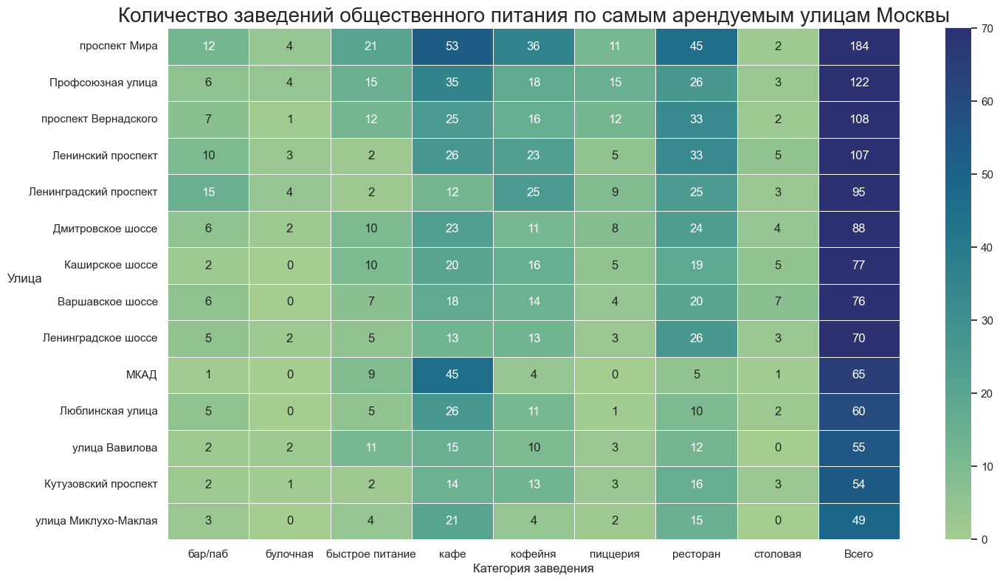

In [23]:
# создадим сводную таблицу по количеству заведений относительно катеорий и улиц
street_data = data.pivot_table(
    index = 'category',
    columns = 'street',
    values = 'name',
    aggfunc = 'count',
    margins = True,
    margins_name = 'Всего'
).T.sort_values(by='Всего', ascending=False).fillna(0) # транспонируем и заполняем пропуски на 0

# отфильтруем таблицу в двумерную таблицу без итогов и огрничим до 15
top_streets = street_data.iloc[1:15]

# построим тепловую карту
#fig = (px.imshow(
#    top_streets, 
#    text_auto = True,
#    title = 'Количество заведений общественного питания по каждому административному округу Москвы',
#    aspect = 'auto',
#    color_continuous_scale = 'tempo',
#    range_color = [0, 55])
#       .update_layout(
#           autosize = False,
#           width = 1000,
#           height = 800,
#           xaxis_title = 'Категория заведения', 
#           yaxis_title = 'Улица',
#           title_x=0.5
#       )
#      )
#fig.show()

# построим тепловую карту
sns.heatmap(
    top_streets, 
    annot=True,  
    cmap='crest', 
    vmax = 70,
    linewidth=.5,
    fmt='.3g'
)
plt.xlabel('Категория заведения')
plt.ylabel('Улица', rotation=0)
plt.title('Количество заведений общественного питания по самым арендуемым улицам Москвы', {'fontsize': 20})

plt.show()

Улицы с наибольши количеством заведений - пр. Мира, Профсоюзная ул., пр. Вернадского и Ленинский пр. На каждой расположены свыше 100 заведений общественного питания. Чаще других на этих улицах располагаются кафе, кофейни и рестораны. Посмотрим, какова плотность заведений общественного питания у каждого из АО.

In [24]:
# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаем датафрейм со средним рейтингом заведений каждого АО
data_cnt = data.groupby('district')['name'].agg('count').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = data_cnt,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Количество заведений по административным округам',
).add_to(m)

# выведем карту
m

Как всегда лидирует Центральный АО (от 2000 заведений и более). Опять-таки лидерство связано с туристической зоной и высоким уровнем жизни. Стандартное количество заведений в округе варьируется от 700 до 1000. Меньше всех заведений приходится на Юго-Западный, Северо-Западный и Юго-Восточный АО (до 700 завдедений на АО).  
В этом отношении интересно посмотреть на то, как распределились значения на улицах с одним завдением. Посмотрим тепловую карту и хороплет таких улиц. 

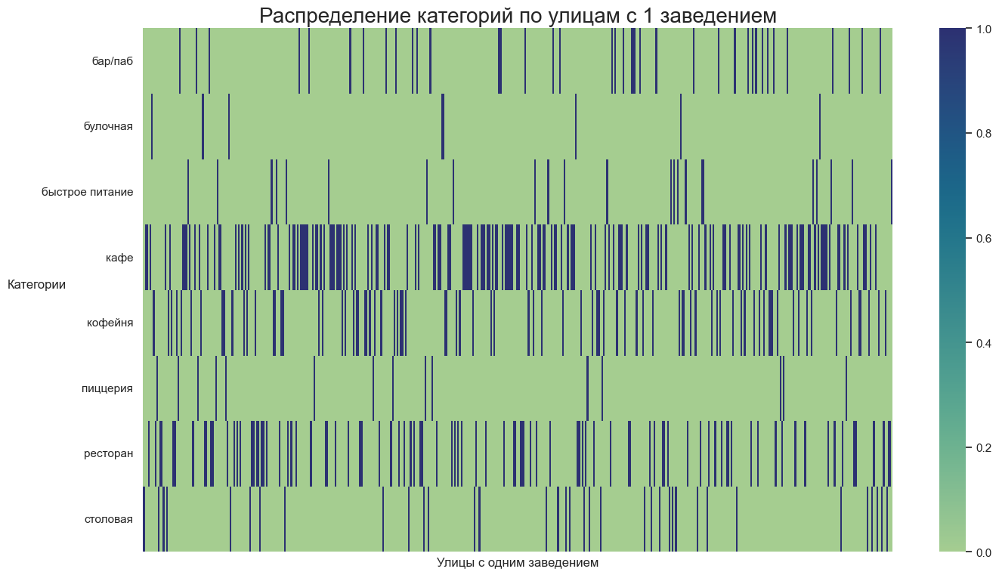

In [25]:
# отфильтруем таблицу по 1 заведению на улицу
outsider_streets = street_data[street_data['Всего'] == 1][[
    'бар/паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'
]].T

# построим тепловую карту
sns.heatmap(
    outsider_streets,  
    cmap = 'crest', 
    linewidth = 0
)
plt.xlabel('Улицы с одним заведением')
plt.ylabel('Категории', rotation=0)
plt.title('Распределение категорий по улицам с 1 заведением', {'fontsize': 20})

# уберем названия улиц
plt.tick_params(
    axis = 'x',        
    which = 'both',     
    bottom = False,      
    top = False,        
    labelbottom = False
)

plt.show()

In [26]:
# импортируем средства кластеризации и кастомных иконок
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту с центром и начальным зумом 10
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создадим датафрейм для получения списка улиц с 1 заведением
coordinates = (data
               .groupby('street')['name']
               .agg('count')
               .reset_index()
              )
# фильтруем те заведения, которые являются единственными
coordinates = coordinates[coordinates['name']==1]
# получим исходный датафрейм, отфильтрованный по заведениям-одиночкам
data_lonely = data[data['street'].isin(coordinates['street'])]

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# создадим словарь с категорией и его маркером
marker_per_categ = {'кафе': 'https://img.icons8.com/?size=80&id=115630&format=png', 
                    'ресторан': 'https://img.icons8.com/?size=80&id=PWGPpCkYxr74&format=png', 
                    'кофейня': 'https://img.icons8.com/?size=80&id=r6wX8viW8c8B&format=png', 
                    'пиццерия': 'https://img.icons8.com/?size=48&id=80764&format=png', 
                    'бар/паб': 'https://img.icons8.com/?size=80&id=9gXZglasUvEe&format=png', 
                    'быстрое питание': 'https://img.icons8.com/?size=64&id=wqMCXXwVnkX2&format=png', 
                    'булочная': 'https://img.icons8.com/?size=48&id=Lp28ZUdhGtAX&format=png', 
                    'столовая': 'https://img.icons8.com/?size=64&id=p9AjU6k4Eb7H&format=png'
                   }

# объявим функцию, которая принимает строку датафрейма,
# внутри создаем маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon = CustomIcon(marker_per_categ[row.loc['category']], icon_size=(30, 30))
    folium.Marker(
        [row['lat'], row['lng']],
        tooltip = f"{row['category']}",
        popup = f"{row['name']} {row['rating']}",
        icon = icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_lonely.apply(create_clusters, axis=1) 

# создаем датафрейм для хороплета, где указано количество таких заведений на округ
lonely_areas = data_lonely.groupby('district')['name'].agg('count').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = lonely_areas,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Плотность улиц c 1 заведением по административным округам Москвы',
).add_to(m)
    
# выводим карту
m

Кафе, кофеен и ресторанов больше всего относительно улиц с одним завдеением. Булочных, пиццерий и заведений быстрого питания, наоборот, намного меньше. Во многом это связано с зависимостью от проходимостьи улицы: если кафе, кофейни и рестораны часто посещают одни и те же люди, то булочные, пиццерии и заведения быстрого питания во многом завязаны на потоке людей (включая опцию "с собой"). Относительно административного деления лидером все равно остается Центральный АО, а наименьшей плотностью отличись те же западные и Юго-Восточный АО.  
Для полноты картины важно учитывать и средний чек. Посмотрим, как распределены значения среднего чека.

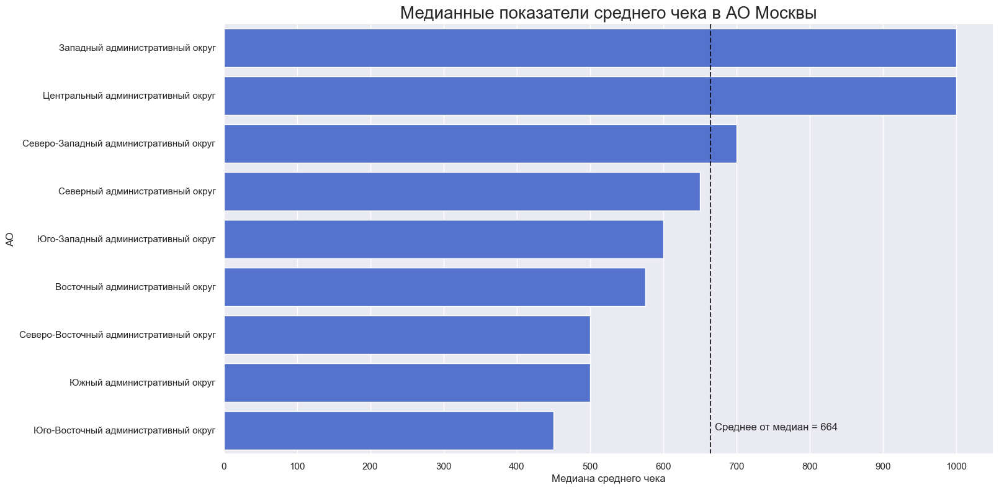

In [27]:
# отфильтруем и подготовим данные для получения медианы среднего чека для каждого района
median_per_district = (data[data['middle_avg_bill'] > 0][['district', 'middle_avg_bill']]
                       .groupby('district')['middle_avg_bill']
                       .agg('median')
                       .sort_values(ascending = False)
                       .reset_index()
                      )

# построим столбчатую диаграмму и созраним ее в переменной "ax"
ax = sns.barplot(
    data = median_per_district,
    x = 'middle_avg_bill',
    y = 'district',
    color = 'royalblue'
)
plt.xlabel('Медиана среднего чека')
plt.ylabel('АО', rotation=90)
plt.title('Медианные показатели среднего чека в АО Москвы', {'fontsize': 20})
plt.xticks(np.arange(0, 1001, step=100))

# добавим среднее для всех медиан для конекста сравнения
plt.axvline(
    x = median_per_district['middle_avg_bill'].mean(),
    linestyle = '--',
    color = (0, 0, 0, 0.8)
)

# подпишем линию
plt.annotate(
    text = f'Среднее от медиан = {median_per_district["middle_avg_bill"].mean():.0f}',
    xy = (670, 8)
)

plt.show()

Как мы видим, самые дорогие АО - Западный и Центральный (1000 р.). Немногим выше среднего от медиан (670 р.) выходит чек у Северо-Западного округа. Немногим ниже у Северного округа (650 р.). У остальных ниже 600 р. Нименьший показатель медианного чека у Юго-Восточного АО.  
Дополним диаграмму хороплетом с разницей медианных чеков от среднего показателя.

In [28]:
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создадим столбец с разницей медианы среднего чека от среднего среднего по Москве
median_per_district['difference'] = median_per_district['middle_avg_bill'] - median_per_district['middle_avg_bill'].mean()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = median_per_district[['district', 'difference']],
    columns = ['district', 'difference'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Разница от среднего медианы среднего чека по административным округам Москвы',
).add_to(m)

# выведем карту
m

Опять-таки центр и запад самые высокие по среднему чеку, что дополнительно может объясняться исторической значимостью округов.  

Дополнительно рассмотрим режим работы, а именно - круглосуточный режим и количество заведений, работающих по такому режиму.

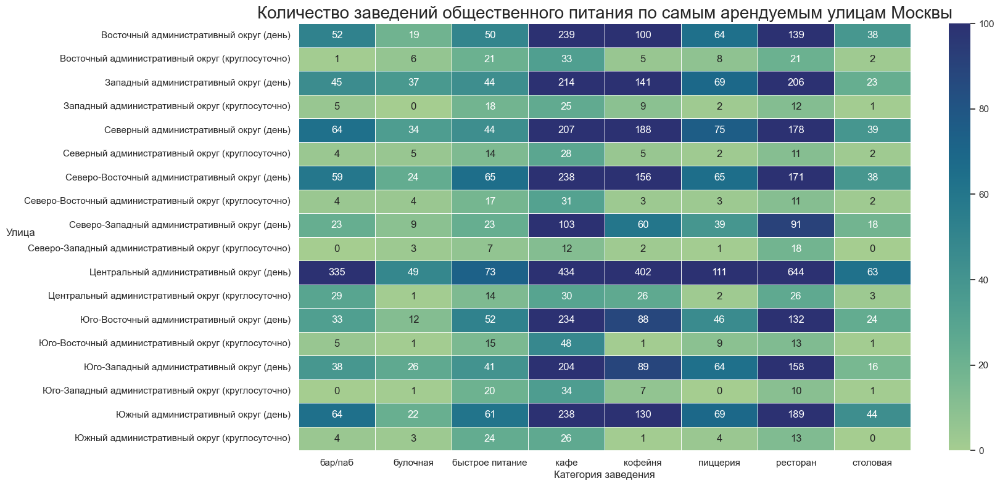

In [29]:
# отфильтруем и подготовим данные
hours_cnt = (data[['name', 'category', 'district', '24/7']]
             .pivot_table(
                 index = ['district', '24/7'], 
                 values = 'name', 
                 columns = 'category',  
                 aggfunc = 'count',
                 #margins = True
             )
             .fillna(0)
             .reset_index()
             .replace({False: '(день)', True: '(круглосуточно)'})
            )
# скроим новый индекс из двух старых
hours_cnt['new_index'] = hours_cnt['district'] + ' ' + hours_cnt['24/7'].astype(str)
hours_cnt = hours_cnt[['new_index', 'бар/паб', 'булочная', 'быстрое питание', 
                       'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].set_index('new_index')

# построим тепловую карту
#fig = (px.imshow(
#    hours_cnt, 
#    text_auto = True,
#    title = 'Количество заведений разных категорий относительно круглосуточного режима работы',
#    aspect = 'auto',
#    color_continuous_scale = 'tempo',
#    range_color = [0, 650])
#       .update_layout(
#           autosize = False,
#           width = 1000,
#           height = 800,
#           xaxis_title = 'Категория заведения', 
#           yaxis_title = 'АО',
#           title_x=0.5
#       )
#      )
#fig.show()

# построим тепловую карту
sns.heatmap(
    hours_cnt, 
    annot=True,
    vmax = 100,
    cmap='crest', 
    linewidth=.5,
    fmt='.3g'
)
plt.xlabel('Категория заведения')
plt.ylabel('Улица', rotation=0)
plt.title('Количество заведений общественного питания по самым арендуемым улицам Москвы', {'fontsize': 20})

plt.show()

Во всех АО количество круглосуточных заведений незначительно, однако заметно небольшое преобладание баров/пабов, ресторанов и заведений быстрого питания. Посмотрим, как круглосуточные заведения распределены по АО на хороплете.

In [30]:
# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту с центром и начальным зумом 10
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# фильтруем те заведения, которые являются круглосуточными
data_24 = data[data['24/7']==True]

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# объявим функцию, которая принимает строку датафрейма,
# внутри создаем маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon = CustomIcon(marker_per_categ[row.loc['category']], icon_size=(30, 30)) # словарь объявляли ранее {категория:png}
    folium.Marker(
        [row['lat'], row['lng']],
        tooltip = f"{row['category']}",
        popup = f"{row['name']} {row['rating']}",
        icon = icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_24.apply(create_clusters, axis=1)  

# создадим датафрейм с количеством круглосуточных заведений на округ
density_of_24 = data_24.groupby('district')['name'].agg('count').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = density_of_24,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Плотность круглосуточных заведений по округам Москвы',
).add_to(m)
    
# выводим карту
m

Центральный АО как всегда лидирует, однако примечательно то, что плотность круглосуточных заведений выше у восточных АО, которые стандартно имеют рейтинг и количество заведений ниже. Вероятнее всего, это связано с большим количеством заведений быстрого питания, поскольку средний чек у них ниже.

Дополним наше исследование анализом заведений с плохим рейтингом. Но как классифицировать оценку "плохо"? В представленном датасете рейтинг оценивается по 5-балльной шкале, т.е. от "очень плохо" до "отлично", тогда оценка 1 - "очень плохо", 2 - "плохо". Таким образом, под плохими рейтингами мы будем оценивать промежуток (1:3), т.е. половину от всех промежутков, т.к. промежутков в шкале 4.

In [31]:
# отфильтруем данные с плохим рейтингом по значению меньше 4
bad_data = data[data['rating']<4]
bad_data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,24/7
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500,-1,0,-1,МКАД,False
36,Пекарня № 1 Грузинская кухня,кафе,"Москва, Коровинское шоссе, 33А",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,unknown,unknown,-1,-1,0,21,Коровинское шоссе,False


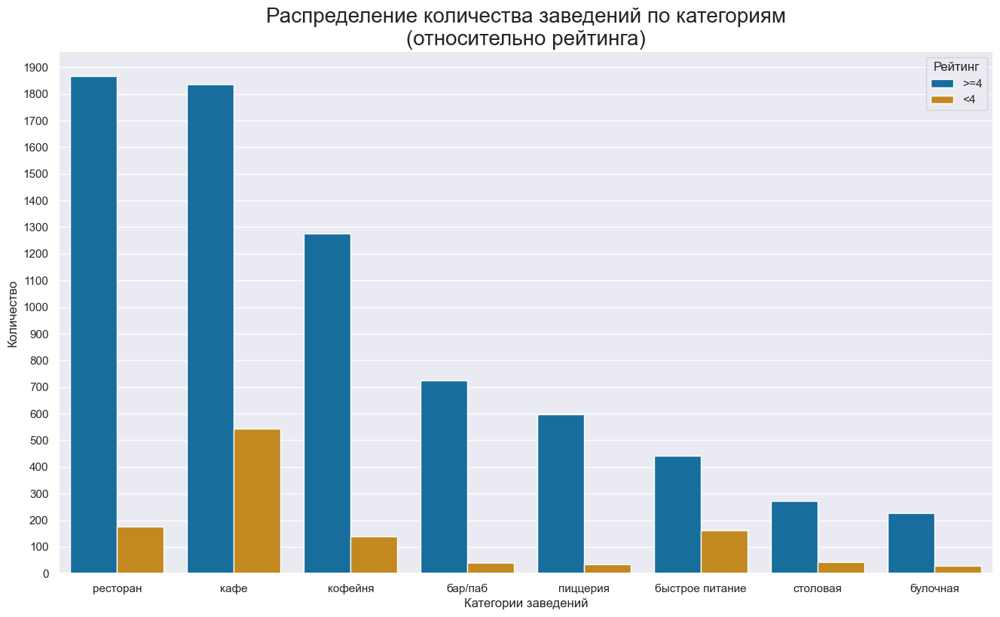

In [32]:
# посмотрим, как много заведений с плохим рейтингом ото всего числа в каждой категории
data['bad_rating'] = data['rating']<4

# создадим новую таблицу для визуализации
bad_share = data.groupby(['category', 'bad_rating'])['name'].agg(
    'count'
).reset_index(
    drop=False
).sort_values(
    by='name', 
    ascending=False
).replace({False: '>=4', True: '<4'})

# визуализируем количество заведений разных категорий в разврезе рейтинга
ax = sns.barplot(
    data = bad_share,
    x = 'category',
    y = 'name',
    hue = 'bad_rating'
)
plt.xlabel('Категории заведений')
plt.ylabel('Количество')
plt.title('Распределение количества заведений по категориям\n(относительно рейтинга)', {'fontsize': 20})
plt.legend(title='Рейтинг')
plt.gca().yaxis.set_major_locator(plt.MultipleLocator(100))
plt.show()

Как мы видим, больше всего заведения с низким рейтингом встречаются в категориях "кафе", "ресторан" и "быстрое питание". Дополним диаграмму сравнением средних чеков по категориям в разбивке по заведениям с высокими рейтингами и низкими.

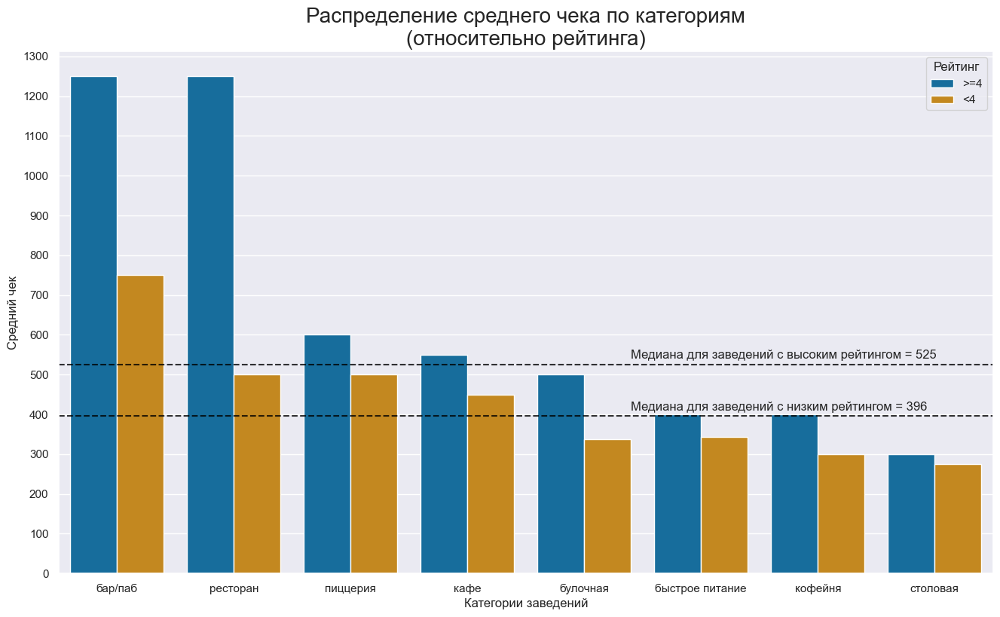

In [33]:
# создадим датафрейм со средним чеком для каждой категории
standart_bill = data[data['middle_avg_bill']>0].groupby(['category', 'bad_rating'])['middle_avg_bill'].agg(
    'median'
).reset_index(
    drop=False
).sort_values(
    by='middle_avg_bill', 
    ascending=False
).replace({False: '>=4', True: '<4'})

# визуализируем количество заведений разных категорий в разврезе рейтинга
ax = sns.barplot(
    data = standart_bill,
    x = 'category',
    y = 'middle_avg_bill',
    hue = 'bad_rating'
)
plt.xlabel('Категории заведений')
plt.ylabel('Средний чек')
plt.title('Распределение среднего чека по категориям\n(относительно рейтинга)', {'fontsize': 20})
plt.legend(title='Рейтинг')
plt.gca().yaxis.set_major_locator(plt.MultipleLocator(100))

# добавим медиану для заведений с хорошими и плохими рейтингами для конекста сравнения
plt.axhline(
    y = standart_bill[standart_bill['bad_rating']=='>=4']['middle_avg_bill'].median(),
    linestyle = '--',
    color = (0, 0, 0, 0.8)
)

plt.axhline(
    y = standart_bill[standart_bill['bad_rating']=='<4']['middle_avg_bill'].median(),
    linestyle = '--',
    color = (0, 0, 0, 0.8)
)

# подпишем линии
plt.annotate(
    text = f'Медиана для заведений с высоким рейтингом = {standart_bill[standart_bill["bad_rating"]==">=4"]["middle_avg_bill"].median():.0f}',
    xy = (4.4, 540)
)

plt.annotate(
    text = f'Медиана для заведений c низким рейтингом = {standart_bill[standart_bill["bad_rating"]=="<4"]["middle_avg_bill"].median():.0f}',
    xy = (4.4, 410)
)

plt.show()

Как и ожидалось, средний чек у заведений с низким рейтингом ниже аналогичного показателя у заведений с высоким. Разница составляет около 130 рублей. Отдельно следует отметить и то, что у баров/пабов и ресторанов с высокими рейтингами средний чек почти в 2 раза выше, нежели у тех же категорий с низкими рейтингами. Во многом это объясняется тем, что такие заведения часто не подразумевают широкую аудиторию и постоянный спрос.  
Дополнительно посмотрим, как распределены заведения с низким рейтингом по АО Москвы на хороплете.

In [34]:
# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту с центром и начальным зумом 10
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# объявим функцию, которая принимает строку датафрейма
# внутри создаем маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon = CustomIcon(marker_per_categ[row.loc['category']], icon_size=(30, 30)) # словарь объявляли ранее {категория:png}
    folium.Marker(
        [row['lat'], row['lng']],
        tooltip = f"{row['category']}",
        popup = f"{row['name']} {row['rating']}",
        icon = icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
bad_data.apply(create_clusters, axis=1)  

# создадим датафрейм с количеством круглосуточных заведений на округ
density_of_bad = bad_data.groupby('district')['name'].agg('count').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = density_of_bad,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Плотность заведений с низким рейтингом по округам Москвы',
).add_to(m)
    
# выводим карту
m

В этом отношении лидерами выступают Южный и Юго-Западный АО - свыше 150 заведений. Немногим меньше в Западном, Восточном и Северо-Восточном - свыше 130 завдений. Нименьшее количество заведений с низкими рейтингами демонстрирует Северо-Западный АО до 80 заведений.

### Промежуточный вывод
По результатам исследования данных мы можем резюмирвоать наши выводы следующим образом:  
- наиболее распространенными категориями в Москве выступают кафе, кофейни и рестораны, занимающие 2/3 от всех заведений;
- лидеры по количеству посадочных мест - рестораны, пабы/бары и кофейни (80 и более) при медианном значении посадочных мест для заведений Москвы - 70;
- сетевые заведения намного больше распространены, нежели несетевые, и чаще всего сети реализованы в форме кафе, ресторанов и кофеен;
- лидером по количеству заведений выступает Центральный АО, а наименьшее число заведений у Северо-Западного АО, остальные же АО имеют схожее количество заведений (около 800);
- самый высокий рейтинг у Центрального АО свыше 4.3 при общем около 4.15, а также выше прочих - у Северного АО;
- улицами-лидерами по количеству заведений выступают пр. Мира, Профсоюзная ул., пр. Вернадского и Ленинский пр., начитывая свыше 100 заведений;
- наиболбшее количество заведений в Центральном АО, а нименьшее - в Северо-Западном, Юго-Западном и Юго-Восточном АО;
- улицы с 1 заведением представлены макисмально в Центральном АО, меньше всех в западных и Юго-Восточном АО;
- типовые заведения, единственные на улице, - кофе, кофейни, рестораны;
- средняя сумма чека в заведениях Москвы - 670 р., что мало только для Западного и Центрального АО и много для Южного, Юго-Восточного и Северо-Восточного АО;
- круглосуточные заведения распространены слабо и равномерно относительно категорий;
- больше всего круглосуточных заведений в Центральном и восточных АО, а меньше всего - в Северо-Западном;
- заметная доля заведений с низким рейтингом (ниже 4) присутствует у кафе, ресторанов и быстрого питания;
- средний чек у заведений с низким рейтингом на 130 р. меньше (400 р.), чем у заведений с высокими рейтингами;
- больше всех заведения с низким рейтингом представлены в Южном и Юго-Западном АО, также высок этот показатель у Западного, Восточного и Северо-Восточного АО.

## Открытие кофейни
Закзачик исследования в лице фонда «Shut Up and Take My Money» планируют открыть кофейню, аналогичную «Central Perk» из сериала «Друзья». Основная характеристика предполагаемой кофейни - доступность. Рассмотрим данный запрос в контексте располагаемых данных.

In [35]:
# отфильтруем данные по кофейням
coffee_data = data[data['category']=='кофейня'].reset_index()
# проверим исходные данные датафрейма по кофейням
coffee_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1413 entries, 0 to 1412
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              1413 non-null   int64  
 1   name               1413 non-null   object 
 2   category           1413 non-null   object 
 3   address            1413 non-null   object 
 4   district           1413 non-null   object 
 5   hours              1413 non-null   object 
 6   lat                1413 non-null   float64
 7   lng                1413 non-null   float64
 8   rating             1413 non-null   float64
 9   price              1413 non-null   object 
 10  avg_bill           1413 non-null   object 
 11  middle_avg_bill    1413 non-null   int32  
 12  middle_coffee_cup  1413 non-null   int16  
 13  chain              1413 non-null   int64  
 14  seats              1413 non-null   int16  
 15  street             1413 non-null   object 
 16  24/7               1413 

Всего в Москве 1413 кофеен. Посмотрим, как они распределены по АО Москвы.

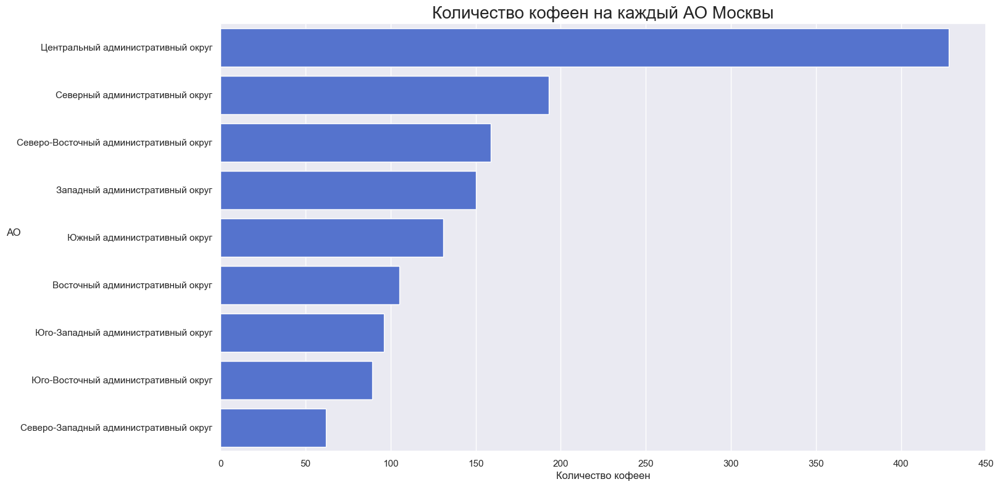

In [36]:
# подготовим датафрейм с группировкой по АО
ao_grouped = coffee_data.groupby('district')['name'].agg('count').reset_index().sort_values(by='name', ascending=False)

sns.barplot(
    data = ao_grouped,
    y = 'district',
    x = 'name',
    color = 'royalblue'
)
plt.xlabel('Количество кофеен')
plt.ylabel('АО', rotation=0)
plt.title('Количество кофеен на каждый АО Москвы', {'fontsize': 20})
plt.xticks(np.arange(0, 500, step=50))

plt.show()

Дополним столбчатую диаграмму хороплетом.

In [37]:
# зададим широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту с центром и начальным зумом 10
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# объявим функцию, которая принимает строку датафрейма,
# внутри создаем маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        tooltip = f"{row['category']}",
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_data.apply(create_clusters, axis=1)  

# создадим датафрейм с количеством кофеен на округ
density_of_coffee = coffee_data.groupby('district')['name'].agg('count').reset_index()

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = density_of_coffee,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Плотность кофеен по округам Москвы',
).add_to(m)
    
# выводим карту
m

Как мы можем наблюдать, ЦОА лидирует по количеству кофеен, значит здесь будет наиболее сильная конкуренция, а выделиться будет очень сложно, даже при оригинальной концепции, поскольку здесь наиболее богатые на бюджеты, а следовательно, и на качество и сервис заведения. В этом отношении намного более умеренными выглядят АО со средним количеством кофеен: Северный, Южный, Западный и Северо-Восточный АО. Здесь ожидается умеренная конкуренция. И наименее заполненные кофейнями АО - Юго-Западный, Юго-Восточный и Северно-Западный АО. Здесь конкуренция будет минимальной, однако наверняка присутствуют "подводные камни" в виде неплатежеспособной аудитории или неадекватно низкого среднего чека. Кстатит, о среднем чеке - посмотрим, каково распределение средней стоимости чашки кофе по АО.

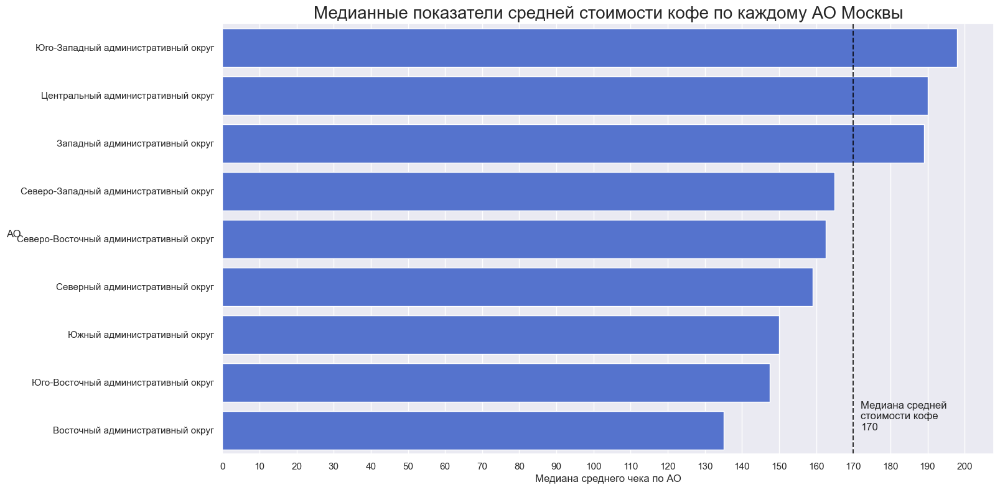

In [38]:
# подготовим данные для визуализации, отфильтровав отсутствующие значения и сгруппировав значения по АО
avg_bill_data = (coffee_data[coffee_data['middle_coffee_cup']>0]
                 .groupby('district')['middle_coffee_cup']
                 .agg('median')
                 .reset_index()
                 .sort_values(by = 'middle_coffee_cup', ascending = False)
                )
# визуализируем данные в виде столбчатой диаграммы
sns.barplot(
    data = avg_bill_data,
    y = 'district',
    x = 'middle_coffee_cup',
    color = 'royalblue'
)
plt.xlabel('Медиана среднего чека по АО')
plt.ylabel('АО', rotation=0)
plt.title('Медианные показатели средней стоимости кофе по каждому АО Москвы', {'fontsize': 20})
plt.xticks(np.arange(0, 201, step=10))

# добавим медиану средней стоимости кружки кофе по всем кофейням
plt.axvline(
    x = coffee_data[coffee_data['middle_coffee_cup']>0]['middle_coffee_cup'].median(),
    linestyle = '--',
    color = (0, 0, 0, 0.8)
)

# подпишем линию
plt.annotate(
    text = f'Медиана средней \nстоимости кофе \n{coffee_data[coffee_data["middle_coffee_cup"]>0]["middle_coffee_cup"].median():.0f}',
    xy = (172, 8)
)

plt.show()

Дополним столбчатую диаграмму хороплетом.

In [39]:
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = avg_bill_data[['district', 'middle_coffee_cup']],
    columns = ['district', 'middle_coffee_cup'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Медиана средней стоимости кружки кофе по АО Москвы',
).add_to(m)

# выведем карту
m

Высокая стоимость кружки кофе (180-200 р.) наблюдается у Центрального, Юго-Западного и Западного округов. Остальные попадают в диапазон от 140 до 170 рублей за исключением самого дешевого среднего чека в Восточном АО - 135 р. Ценовой ориентир одной чашки кофе для новой кофейни в данном случае зависит от выбранного АО. Данный вопрос мы подсветим уже относительно остальных результатов.  
Дополним наши значния рейтингами и круглосуточным режимом работы.

In [40]:
# создадим ящики с усами для каждой переменной
# создадим список с категориями заведений
aos = data['district'].unique()

# выделим необходимые данные для дальнейшей визуализации
rating_coffee = coffee_data[['district','rating']]

# создадим словарь с одноименными списку ключами и предустановленными цветами в качестве значений
colour_dict = {'Северный административный округ': 'navy', 'Северо-Восточный административный округ': 'saddlebrown', 
               'Северо-Западный административный округ': 'crimson', 'Западный административный округ': 'darkcyan',
               'Центральный административный округ': 'darkslategrey', 'Восточный административный округ': 'darkred', 
               'Юго-Восточный административный округ': 'forestgreen', 'Южный административный округ': 'black',
               'Юго-Западный административный округ': 'gray'
              }
# создадим общую фигуру и на ней циклом нанесем ящики с усами
fig = go.Figure()
for ao in aos:
    fig.add_trace(go.Box(
        x = rating_coffee[rating_coffee['district'] == ao]['district'].T,
        y = rating_coffee[rating_coffee['district'] == ao]['rating'].T,
        name = ao,
        boxpoints = 'all',
        fillcolor = 'ivory',
        marker_color = colour_dict[ao]
    )
                 ).update_layout(
        autosize = False,
        width = 1000,
        height = 800,
        xaxis_title = 'АО', 
        yaxis_title = 'Рейтинг',
        title = 'Распределение рейтинга кофеен по АО Москвы'
    )
fig.update_layout(
    title_x = 0.5,
    showlegend = False
    )

fig.show()

Добавим хороплет к ящикам с усами.

In [41]:
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# подготовим данные для хороплета
rating_data = (coffee_data.groupby('district')['rating']
               .agg('median')
               .reset_index()
               .sort_values(by = 'rating', ascending = False)
                )

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = rating_data[['district', 'rating']],
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Медиана рейтинга кофеен в АО Москвы',
).add_to(m)

# выведем карту
m

Рейтинги кофеен во всех АО Москвы распределены почти равномерно - в среднем медианный показатель 4.29, но Западный АО отличается от прочих достаточно слабым рейтингом - 4.2. Вот отличный АО для того, чтобы удивить посетителей и набрать очков доверия с высокими рейтингами.  
Дополнительно рассмотрим, какова плотность круглосуточных кофеен.

In [42]:
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# подготовим данные для хороплета
data_24_7 = (coffee_data[coffee_data['24/7']==True].groupby('district')['name']
             .agg('count')
             .reset_index()
             .sort_values(by = 'name', ascending = False)
            )

# создаём хороплет через конструктор Choropleth и добавим его на карту
folium.Choropleth(
    geo_data = state_geo,
    data = data_24_7[['district', 'name']],
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'GnBu',
    fill_opacity = 0.6,
    legend_name = 'Плотность круглосуточных кофеен в АО Москвы',
).add_to(m)

# выведем карту
m

В основном круглосуточные кофейни расположены в Центральном АО - свыше 20 кофеен работают ночью. Около 10 кофеен с круглосуточным режимом расположены в Западном и Юго-Западном АО, и в остальных АО круглосуточных заведений всего до 5 заведений.

### Промежуточный вывод
По результатам исследования данных для оптимального входа на рынок кофеен можно сделать следующие выводы:  

- лидером по всем показателям выступает Центарльный АО: там наибольшее число кофеен (свыше 400), один из самых дорогих средних чеков за кружку кофе (190 р.), а также высшая плотность круглосуточных кофеен при рейтинге, анологичном остальным АО;
- рейтинг кофеен в разбивке по АО Москвы достаточно однороден: медиана в 4.3 у всех АО кроме Западного АО, что делает его отличным претендентом для расположения новой кофени с более слабыми конкурентами;
- круглосуточные кофейни в АО Москвы редкость, если исключить бурную ночную жизнь города в центре, поэтому при круглосуточном режиме работы все АО кроме Центарльного будут отличной зоной для введения круглосуточной кофейни, т.к. в каждом АО круглосуточных кофеен не более 15 точек на АО;
- средняя стоимость кофе в кофейнях Москвы варьируется от 135 до 200 рублей при медианном показателе 170 р.

Учитывая представленные выше результаты, наиболее благоприятным АО для входа на рынок кофеен будет Западный АО при ограничениях в бюджете и умеренной конкурентоспособности, что объясняется более низким медианным рейтингом относительно остальных АО, высокой стоимости чашки кофе (190 р.) и в целом средняя заполненность АО заведениями той же категории. 

## Презентация для инвесторов
Презентация: [<ссылка на облачное хранилище с презентацией>](https://drive.google.com/file/d/1Gudr-o_yuWoB3AGIgCSGfgp_wPJCDYV-/view?usp=drive_link) 